In [1]:
# Operating system specific functions
import os

# Argument parser, for configuring the program execution
import argparse

# An object oriented library for handling EPANET files in Python
import epynet 

# yaml / yml configuration file support
import yaml

# PyTorch deep learning framework
import torch

# Import the networkx library
import networkx as nx

# Import Pandas for data handling
import pandas as pd

# Import numpy for array handling
import numpy as np

# Matplotlib for generating graphics
import matplotlib.pyplot as plt

# PyTorch from graph conversion tool
from torch_geometric.utils import from_networkx

# Train-test split with shuffle 
from sklearn.model_selection import train_test_split

In [2]:
# Import a custom tool for converting EPANET .inp files to networkx graphs
from utils.epanet_loader import get_nx_graph

# Function for visualisationa
from utils.visualisation import visualise

# EPANET simulator, used to generate nodal pressures from the nominal model
from utils.epanet_simulator import epanetSimulator

# SCADA timeseries dataloader
from utils.data_loader import battledimLoader, dataCleaner, dataGenerator

# PyTorch early stopping callback
from utils.early_stopping import EarlyStopping

# Metrics
from utils.metrics import Metrics


In [9]:
path_to_wdn     = './data/L-TOWN.inp'
path_to_data    = './data/l-town-data/'

In [4]:
# Import the .inp file using the EPYNET library
wdn = epynet.Network(path_to_wdn)

# Solve hydraulic model for a single timestep
wdn.solve()

# Convert the file using a custom function, based on:
G , pos , head = get_nx_graph(wdn, weight_mode='inv_pipe_length', get_head=True)

In [5]:
print('Importing dataset configuration...\n')

# Open the dataset configuration file
with open('./data/l-town-data/dataset_configuration.yaml') as file:

    # Load the configuration to a dictionary
    config = yaml.load(file, Loader=yaml.FullLoader)

# Generate a list of integers, indicating the number of the node
# at which a  pressure sensor is present
sensors = [int(string.replace("n", "")) for string in config['pressure_sensors']]

Importing dataset configuration...



In [6]:
colormap = pd.Series([1.0 if i in sensors else 0.0 for i in range(1,G.number_of_nodes()+1)])

# Generate a colormap
cmap  = plt.get_cmap('coolwarm')

# Fit the datapoints to the colormap
color = cmap(colormap)

# Visualise the the model using our visualisation utility
axis = visualise(G, pos=pos, color = color, figsize = (60,32), edge_labels=True)

plt.show()

In [10]:
leakages_2018 = pd.read_csv('data/l-town-data/2018_Leakages.csv',decimal=',',sep=';',index_col='Timestamp')

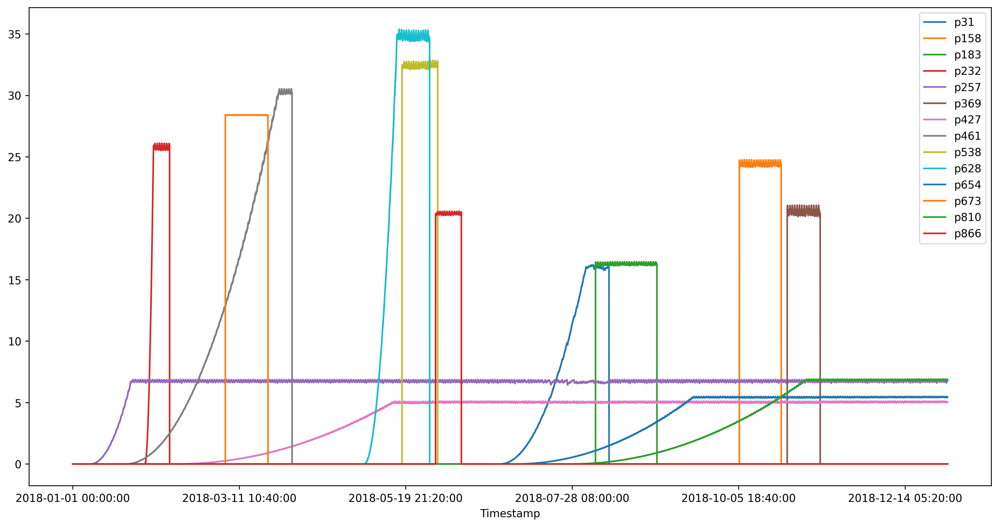

In [11]:
fig = plt.figure(figsize=(16,8),dpi=300)
leakages_2018.plot(ax=plt.gca())
plt.show()

In [12]:
leakages_2019 = pd.read_csv('data/l-town-data//2019_Leakages.csv',decimal=',',sep=';',index_col='Timestamp')

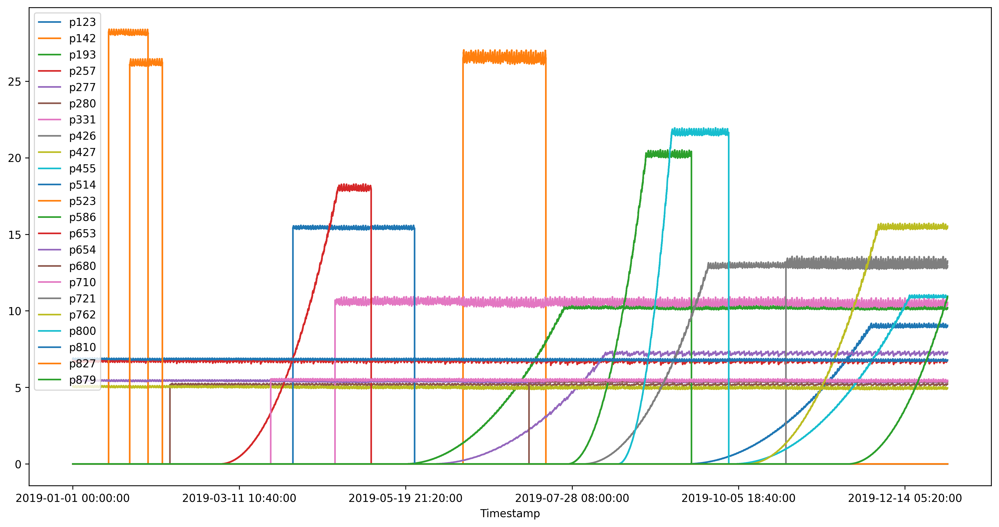

In [13]:
fig = plt.figure(figsize=(16,8),dpi=300)
leakages_2019.plot(ax=plt.gca())
plt.show()

In [14]:
print('Running EPANET simulation to generate nominal pressure data...\n') 

# We run an EPANET simulation using the WNTR library and the EPANET
# nominal model supplied with the BattLeDIM competition. 
# With this simulation, we have a complete pressure signal for all
# nodes in the network, on which the GNN algorithm is to be trained.

# Instantiate the nominal WDN model
nominal_wdn_model = epanetSimulator(path_to_wdn, path_to_data)

# Run a simulation
nominal_wdn_model.simulate()

# Retrieve the nodal pressures
nominal_pressure = nominal_wdn_model.get_simulated_pressure()

Running EPANET simulation to generate nominal pressure data...



In [15]:
nominal_pressure

name,n1,n2,n3,n4,n5,n6,n7,n8,n9,n10,...,n773,n774,n775,n776,n777,n778,n779,n780,n781,n782
0,28.885649,28.229593,28.925112,33.828159,36.537888,31.185562,26.183756,37.625713,32.829617,27.756403,...,52.457668,50.842834,51.985100,45.279144,48.613106,46.187431,46.464058,47.713551,49.513973,49.027523
300,28.900486,28.244280,28.939800,33.842846,36.552296,31.200220,26.198536,37.640057,32.844303,27.771090,...,52.476357,50.860176,52.003483,45.305267,48.638573,46.213013,46.489712,47.739033,49.539490,49.053162
600,28.915424,28.259079,28.954599,33.857647,36.566822,31.214993,26.213409,37.654522,32.859100,27.785879,...,52.494904,50.877392,52.021740,45.331276,48.663929,46.238487,46.515255,47.764404,49.564884,49.078682
900,28.930391,28.273897,28.969416,33.872475,36.581398,31.229792,26.228312,37.669022,32.873928,27.800697,...,52.512928,50.894112,52.039471,45.356632,48.688644,46.263317,46.540150,47.789131,49.589645,49.103565
1200,28.945330,28.288706,28.984215,33.887299,36.595974,31.244581,26.243195,37.683544,32.888744,27.815506,...,52.530228,50.910160,52.056496,45.381069,48.712467,46.287258,46.564156,47.812969,49.613506,49.127548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603600,28.254526,27.599018,28.294537,33.197620,35.908325,30.555126,25.552855,36.996414,32.199078,27.125828,...,52.390083,50.780121,51.918594,45.184193,48.520725,46.094650,46.371037,47.621143,49.421486,48.934597
603900,28.268282,27.612644,28.308163,33.211239,35.921730,30.568724,25.566566,37.009750,32.212696,27.139463,...,52.404682,50.793671,51.932964,45.204330,48.540359,46.114368,46.390812,47.640789,49.441154,48.954361
604200,28.282366,27.626598,28.322117,33.225182,35.935429,30.582640,25.580593,37.023396,32.226639,27.153416,...,52.421234,50.809032,51.949249,45.227543,48.562996,46.137093,46.413582,47.663429,49.463799,48.977104
604500,28.296803,27.640894,28.336412,33.239471,35.949455,30.596899,25.594973,37.037357,32.240917,27.167704,...,52.438648,50.825188,51.966385,45.251743,48.586594,46.160793,46.437347,47.687035,49.487434,49.000851


In [16]:
weight_mode     = 'pipe_length'
self_loops      = True
scaling         = 'minmax'

print('Pre-processing nominal pressure data for training...\n')     

# Populate feature vector x and label vector y from the nominal pressures
# Also retrieve the scale and bias of the scaling transformation
# This is so we can inverse transform the predicted values to calculate
# relative reconstruction errors
x,y,scale,bias = dataCleaner(pressure_df    = nominal_pressure, # Pass the nodal pressures
                                observed_nodes = sensors,          # Indicate which nodes have sensors
                                rescale        = scaling)     # Perform scaling on the timeseries data

# Split the data into training and validation sets
x_trn, x_val, y_trn, y_val = train_test_split(x, y, 
                                                test_size    = 0.2,
                                                random_state = 1,
                                                shuffle      = False)     # To maintain temporal consistency we don't shuffle the pressure data
        

Pre-processing nominal pressure data for training...



In [17]:
pd.DataFrame(x_trn[:,:,0])

,0,1,2,3,4,5,6,7,8,9,...,772,773,774,775,776,777,778,779,780,781
0,0.082881,0.0,0.0,0.183379,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.083183,0.0,0.0,0.183678,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.083487,0.0,0.0,0.183979,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.083791,0.0,0.0,0.184280,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.084095,0.0,0.0,0.184582,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,0.073622,0.0,0.0,0.174194,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1609,0.073450,0.0,0.0,0.174021,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1610,0.073279,0.0,0.0,0.173849,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1611,0.073107,0.0,0.0,0.173675,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
pd.DataFrame(y_trn[:,:,0])

,0,1,2,3,4,5,6,7,8,9,...,772,773,774,775,776,777,778,779,780,781
0,0.082881,0.069541,0.083684,0.183379,0.238477,0.129646,0.027943,0.260596,0.163076,0.059920,...,0.562181,0.529346,0.552572,0.416217,0.484008,0.434685,0.440310,0.465717,0.502325,0.492434
1,0.083183,0.069840,0.083982,0.183678,0.238770,0.129944,0.028243,0.260888,0.163374,0.060218,...,0.562561,0.529698,0.552945,0.416748,0.484525,0.435205,0.440832,0.466235,0.502844,0.492955
2,0.083487,0.070141,0.084283,0.183979,0.239066,0.130245,0.028546,0.261182,0.163675,0.060519,...,0.562938,0.530048,0.553317,0.417277,0.485041,0.435723,0.441351,0.466751,0.503360,0.493474
3,0.083791,0.070442,0.084585,0.184280,0.239362,0.130546,0.028849,0.261477,0.163977,0.060821,...,0.563304,0.530388,0.553677,0.417792,0.485543,0.436228,0.441857,0.467253,0.503864,0.493980
4,0.084095,0.070743,0.084885,0.184582,0.239658,0.130846,0.029151,0.261772,0.164278,0.061122,...,0.563656,0.530714,0.554023,0.418289,0.486028,0.436715,0.442345,0.467738,0.504349,0.494468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,0.073622,0.060340,0.074482,0.174194,0.229393,0.120472,0.018707,0.251540,0.153891,0.050719,...,0.560981,0.528202,0.551381,0.419955,0.486574,0.437310,0.442980,0.468256,0.504832,0.495029
1609,0.073450,0.060167,0.074309,0.174021,0.229218,0.120298,0.018534,0.251365,0.153717,0.050546,...,0.561034,0.528251,0.551432,0.420018,0.486636,0.437372,0.443042,0.468319,0.504894,0.495092
1610,0.073279,0.059995,0.074137,0.173849,0.229044,0.120126,0.018363,0.251191,0.153545,0.050374,...,0.561086,0.528299,0.551483,0.420080,0.486697,0.437434,0.443104,0.468380,0.504956,0.495153
1611,0.073107,0.059822,0.073964,0.173675,0.228870,0.119952,0.018190,0.251016,0.153372,0.050201,...,0.561133,0.528343,0.551530,0.420136,0.486753,0.437490,0.443160,0.468436,0.505011,0.495209
